# NEOSSat Data Reduction Template  
  
The NEOSSat mission consists of a 15-cm optical telescope that is capable of obtaining high-cadence time-series imaging.  This worksheet was designed to reduce NEOSSat image, extract photometry and detrend the photometry. 
  
Required Modules:  
- numpy [Numerics]
- matplotlib [Plots]
- astropy [FITS I/O]


## Import system modules

In [1]:
import numpy as np #We will make extensive use of Numpy arrays 

## Use Matplotlib for plotting

In [2]:
import matplotlib  #ploting
matplotlib.use("Agg")  #some hack to stop the bouncing python icon when plotting of os/x
import matplotlib.pyplot as plt

## Enable Inline plotting  
  
  Choices are either "inline" or "notebook".  Inline is a cleaner easier choice that makes operation of the worksheet more automated.  Notebook style enables interaction with the plots, but you must remember to close the dialog before proceeding or plots may overlap or end up in unexpected places.

In [3]:
%matplotlib inline

## Import NEOSSat Python Library  
  
  The "neossatlib.py" source file includes functions for reading and manipulation of NEOSSat FITS files.

In [4]:
import neossatlib as neo

## Global Parameters  
  
  Parameters that control the data reduction process.

In [5]:
darklist="betapic_darks.list"  #Text file that lists dark-files
imagelist="betapic_image.list" #Text file that lists science field images
bpix=-1.0e10                   #value to mark bad pixels. Any pixel *below* bpix is considered invalid.
sigscalel=0.2                  #low bounds for display clipping.  Keep small to keep background 'dark'
sigscaleh=0.5                  #high bounds for display clipping.
#--- Parameters for making a Dark image ---#
ilow=1                         #number of low value frames to reject when generating dark image
ihigh=1                        #number of high value frames to reject when generating dark image
#--- Centroiding Parameters ---#
itermax=5                      #Maximum number of interations to update centroid
dcoocon=0.1                    #Centroid position updated is converged when it changes by less than this value (pixels)
ndp=3                          #half-length size of box to find centroid center. (box side has length 2*ndp)
#--- Parameters for photometry ---#
sbox=10                        #simple half-length box for simple box-photometry. (box side has length 2*sbox)
magzero=20.                    #zero-point for instrumental magnitude

## Star List  
  
  Initial list of stars to extract photometry for.  Position should be within a few pixels as a good starting guess.

In [6]:
starlist=[]
starlist.append([570.0,760.0,'beta Pic'])

## Show Documentation for each Command  
  
  Basic usage documentation exists for each routine.  

In [7]:
neo.read_fitsdata.__doc__

'Usage scidata=read_fitsdata(filename)'

In [8]:
neo.read_file_list.__doc__

'Usage files=read_file_list(filelist)'

In [9]:
neo.combine.__doc__

'Usage: masterimage=combine(imagefiles)'

In [10]:
neo.darkcorrect.__doc__

'Usage: m,c=darkcorrect(scidata,masterdark,pbix)'

## Read in file lists

In [11]:
darkfiles=neo.read_file_list(darklist)
imagefiles=neo.read_file_list(imagelist)

In [12]:
imagefiles[0]

'betapic/NEOS_SCI_2017160050500_clean.fits'

## Read in FITS file

In [13]:
filename=imagefiles[0] #use first image as an example
scidata=neo.read_fitsdata(filename)

## Image Statistics  
  
  Calculate basic statistics of one of our science images.  These stats will be used for various plots.

In [14]:
imstat=neo.imagestat(scidata,bpix)
print('Min:', imstat[0])
print('Max:', imstat[1])
print('Mean:', imstat[2])
print('Stdev:', imstat[3])
print('Median:', imstat[4])

Min: 1608.0
Max: 65535.0
Mean: 1748.9981044413853
Stdev: 429.16782400468
Median: 1741.0


## Histogram of Image Counts  
  
  A histogram of the 'raw' image reveals a non-gaussian distribution.  This is due to the substantial dark current that needs to be dealt with.

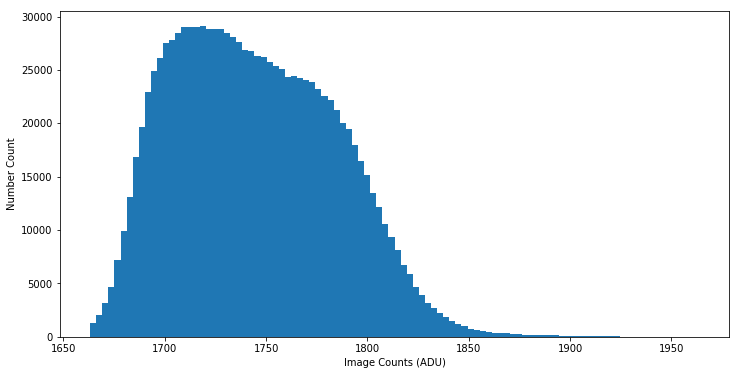

In [15]:
neo.plot_histogram(scidata,imstat,sigscalel,sigscaleh)

## Displaying Image

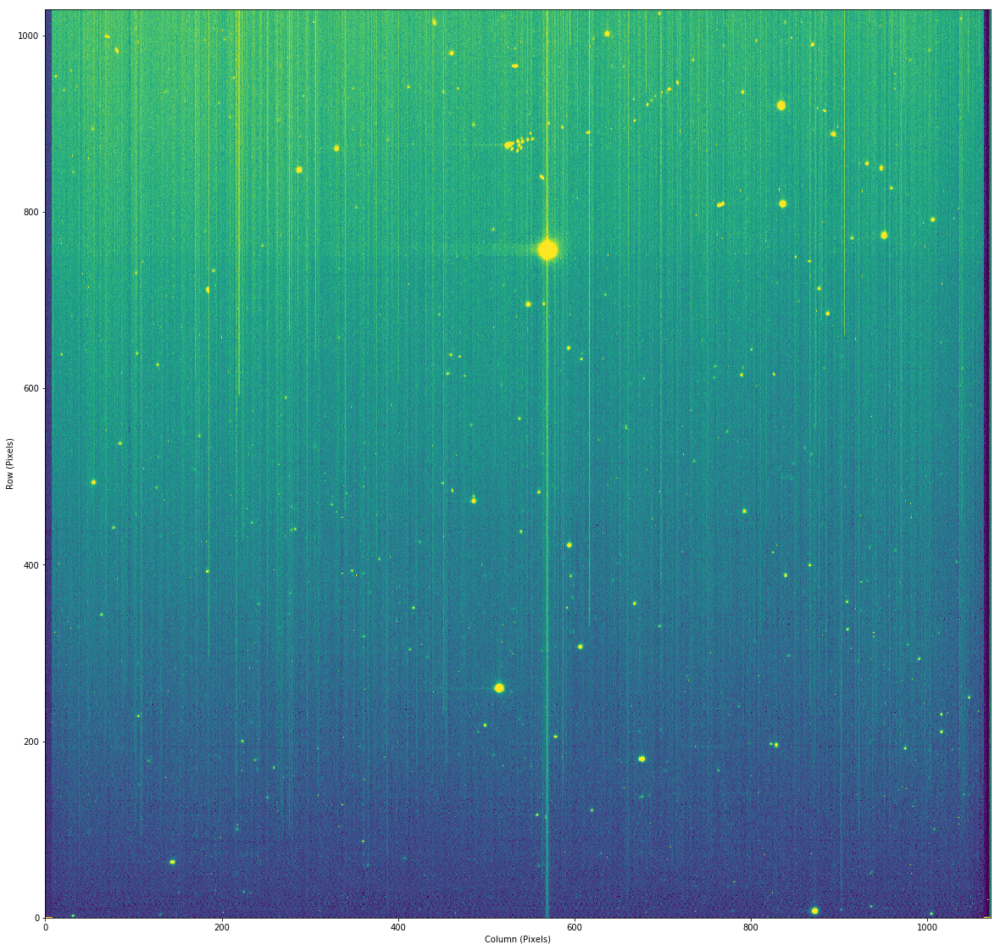

In [16]:
neo.plot_image(scidata,imstat,sigscalel,sigscaleh)

## Dark Images  
  
  NEOSSat images require Dark/Bias corrections.  For beta Pic there are 4 darks available.  
    
  First we generate a Master dark image by combining all dark images together.  The algothrim uses a simple mean with the highest and lowest value excluded.  Excluding high and low values does a good job of removing cosmic rays.  Ideally we want at least 10 darks when constructing the Master, but having 4 is a good start to explore the quality of the observations. 

In [17]:
masterdark=neo.combine(darkfiles,ilow,ihigh,bpix)

We now plot our masterdark using the same scale as the science image.

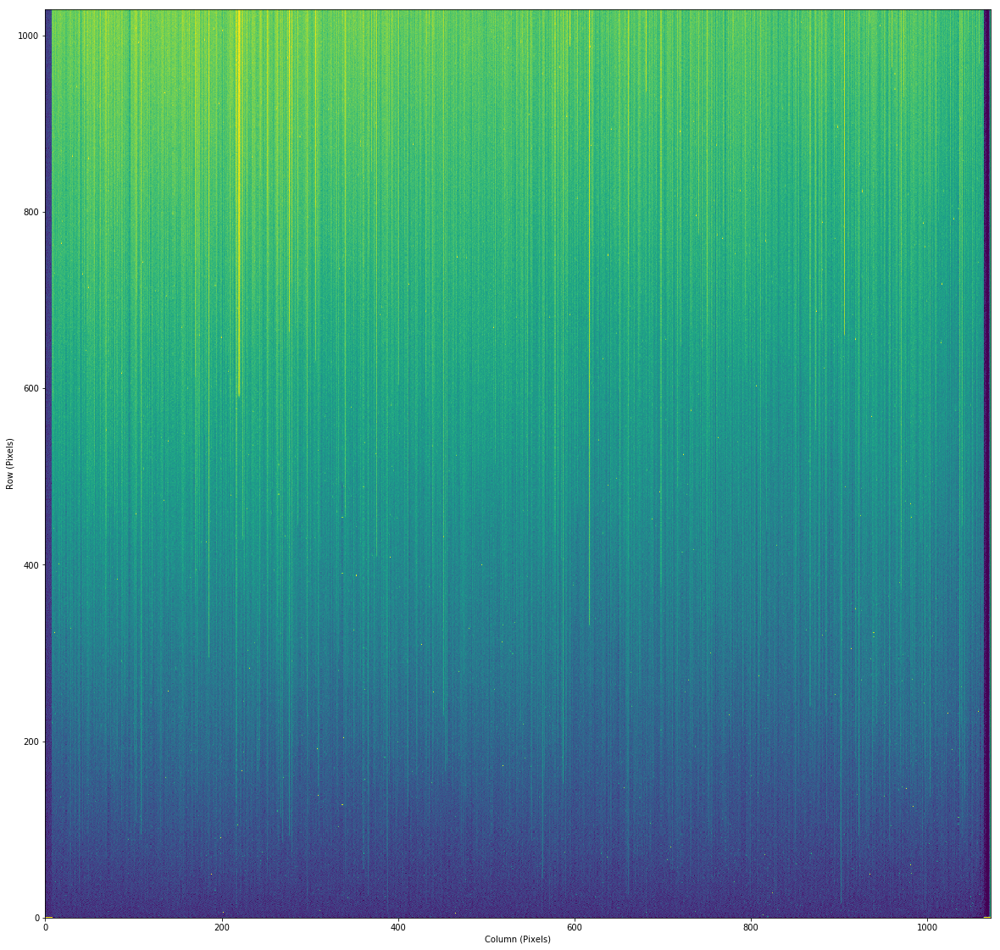

In [18]:
neo.plot_image(masterdark,imstat,sigscalel,sigscaleh)

We now calculate and apply a dark correction to our test image.  The dark image is scaled to match the science image using a robust fit. The robust fit excludes bright pixels (i.e., stars).  This assumes the dark can be easily scaled to match changing physical conditions such as detector temperature.

The python darkcorrect routine is currently not well optimized (Fortran version works very well!). Takes a minute or two to run for a 1Kx1K image.

In [19]:
m,c=neo.darkcorrect(scidata,masterdark,bpix)  #calculate scaling values, including zero-point offset (sky + bias)
scidata_clean=scidata-(c+m*masterdark)        #scale and subtract master dark from science image

In [20]:
imstat_clean=neo.imagestat(scidata_clean,bpix)
print('Min:', imstat_clean[0])
print('Max:', imstat_clean[1])
print('Mean:', imstat_clean[2])
print('Stdev:', imstat_clean[3])
print('Median:', imstat_clean[4])

Min: -99.8597285067874
Max: 63785.94117647059
Mean: 6.114915136241563
Stdev: 426.82691422282164
Median: 1.0226244343889448


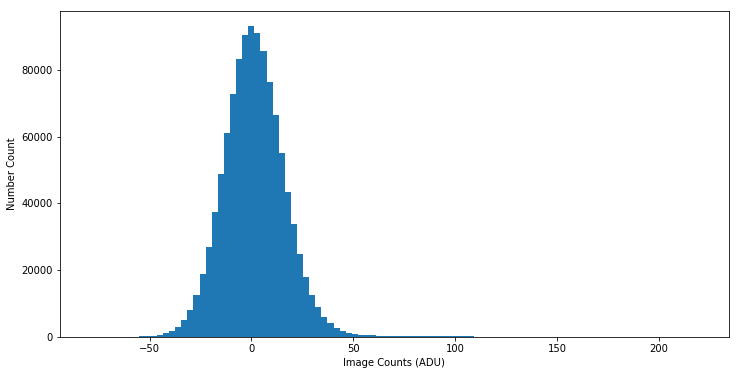

In [21]:
neo.plot_histogram(scidata_clean,imstat_clean,sigscalel,sigscaleh)

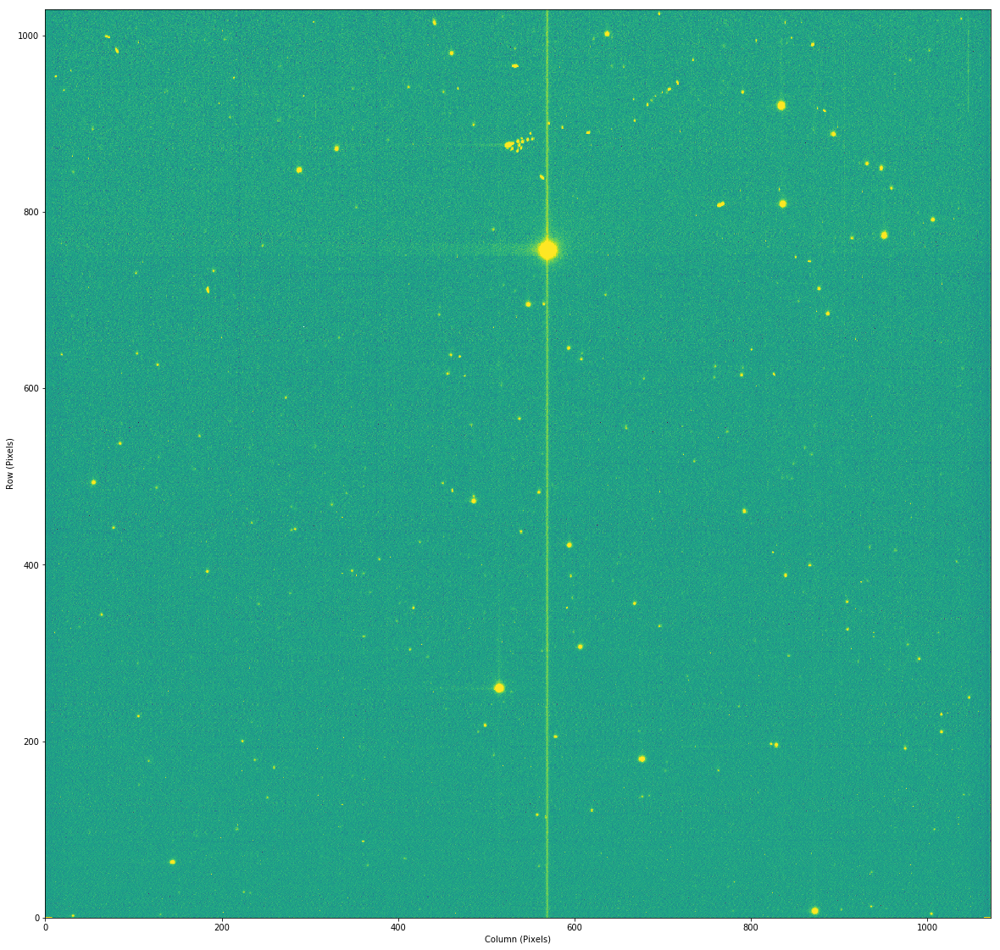

In [22]:
neo.plot_image(scidata_clean,imstat_clean,sigscalel,sigscaleh)

## Column corrections. 
  
  Looks like bright stars may affect overscan.  Subtracting column median values provides a simple correction.

In [23]:
scidata_clean_colcor=neo.columncor(scidata_clean,bpix)

Update image statistics

In [24]:
imstat_clean=neo.imagestat(scidata_clean,bpix)
print('Min:', imstat_clean[0])
print('Max:', imstat_clean[1])
print('Mean:', imstat_clean[2])
print('Stdev:', imstat_clean[3])
print('Median:', imstat_clean[4])

Min: -99.8597285067874
Max: 63785.94117647059
Mean: 6.114915136241563
Stdev: 426.82691422282164
Median: 1.0226244343889448


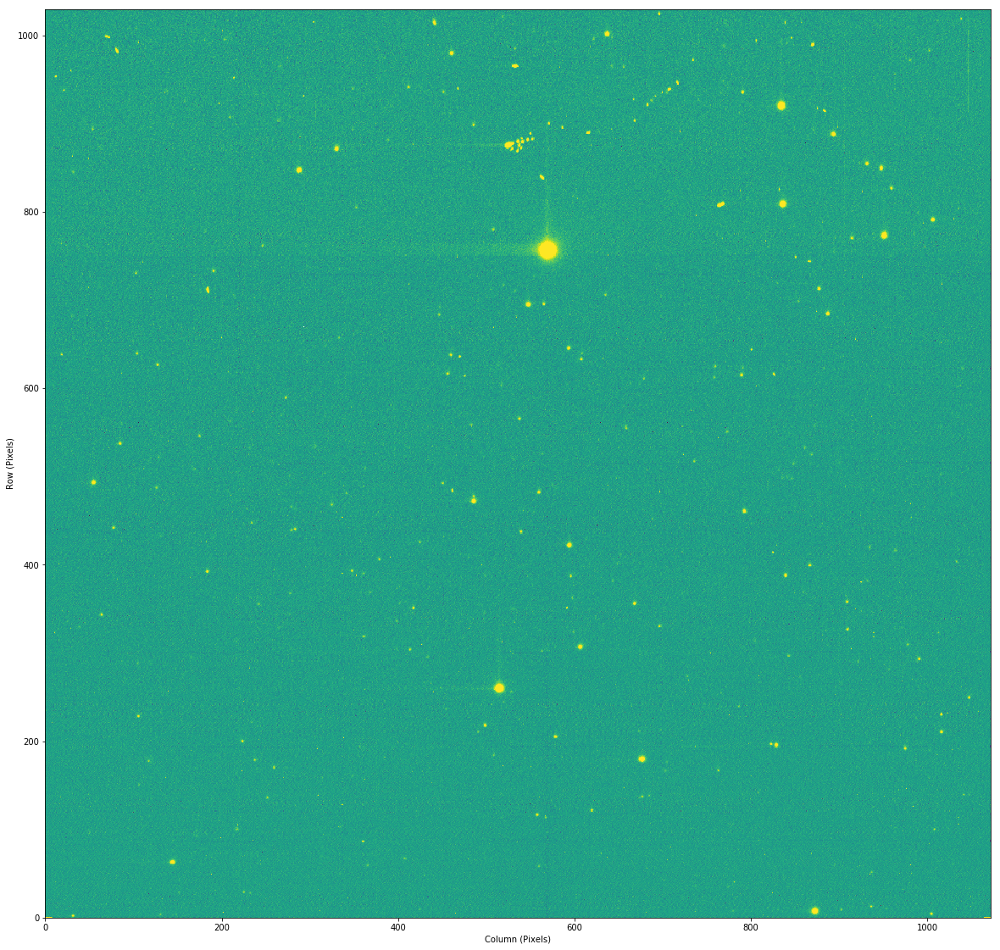

In [25]:
neo.plot_image(scidata_clean_colcor,imstat_clean,sigscalel,sigscaleh)

## Centroids  
  
  With a reduced image we can now turn our attention to measuring the brightness of stars.  First we can update centroids based on our initial guesses.

In [26]:
print(starlist)
starlist_cen=neo.photo_centroid(scidata,bpix,starlist,ndp,dcoocon,itermax)
print(starlist_cen)

[[570.0, 760.0, 'beta Pic']]
[['568.4155744161347' '755.0803877380201' 'beta Pic']]


## Photometry  
  
  We are now ready to measure the brighness of the star.  

Use the median from imstats as a sky estimate.

In [27]:
sky=imstat_clean[4]    

Extract photometry using a simple box.

In [29]:
boxsum=neo.phot_simple(scidata_clean_colcor,starlist_cen,bpix,sbox,sky)
print(boxsum)

[3162154.0723981904]


Convert to an uncalibrated instrumental magnitude (if useful)

In [30]:
mag = magzero - 2.5*np.log10(boxsum)
print(mag)

[3.75004243]
